In [ ]:
# import libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torchvision.transforms import transforms

from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import multiprocessing


In [ ]:
# visualization function

def show(tensor, ch=1, size = (28,28), num_imgs = 16):
  # tensor: 128 X 784
  data = tensor.detach().cpu().view(-1, ch, *size) # 128 x 1 x 28 x 28
  grid = make_grid(data[:num_imgs], nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()

# 1. Hyperparameters

In [ ]:
epochs = 100
cur_step = 0
batch_size = 128
info_steps = 300
mean_gen_loss = 0
mean_disc_loss = 0

num_workers = multiprocessing.cpu_count()

z_dim = 64
lr = 3e-4
loss_fn = nn.BCEWithLogitsLoss()

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# 2. Get data

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
]
)

In [ ]:
dataset = MNIST(root = './data/',
                train = True,
                transform = transform,
                download = True)
dataloader = DataLoader(dataset, batch_size = batch_size, shuffle = True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



# 3. Generator

In [ ]:
def generate_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

In [ ]:
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace = True)
        )
class Generator(nn.Module):
  def __init__(self, z_dim = 64, i_dim = 28*28, h_dim = 128) -> None:
    super().__init__()
    self.g = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, 2 * h_dim), # 128, 256
        genBlock(2 * h_dim, 4 * h_dim), 
        genBlock(4 * h_dim, 8 * h_dim),
        nn.Linear(8 * h_dim, i_dim),
        nn.Sigmoid()
    )

  def forward(self, noise):
    return self.g(noise)

In [ ]:
gen = Generator().to(device)
gen

Generator(
  (g): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

# 4. Discriminator

In [ ]:
def discBlock(inp, out):
  return nn.Sequential(
     nn.Linear(inp, out), # 64, 128
     nn.LeakyReLU(0.2)
        )

class Discriminator(nn.Module):
  def __init__(self, i_dim = 28 * 28, h_dim = 256):
    super().__init__()
    self.d = nn.Sequential(
    discBlock(i_dim, 4 * h_dim), # 64, 128
    discBlock(4 * h_dim, 2 * h_dim),
    discBlock(2* h_dim, h_dim), # 128, 256
    nn.Linear( h_dim, 1),
    nn.Sigmoid()
)
  def forward(self, X):
    return self.d(X)

In [ ]:
disc = Discriminator().to(device)

# 5. Optimizer

In [ ]:
gen_opt = torch.optim.Adam(gen.parameters(), lr)
disc_opt = torch.optim.Adam(disc.parameters(), lr)

# 6. Calculating loss values

In [ ]:
def calc_gen_loss(loss_fn, gen, disc, number, z_dim):
  noise = generate_noise(batch_size, z_dim)
  fake = gen(noise)
  pred_fake = disc(fake)

  targets = torch.ones_like(pred_fake)
  gen_loss = loss_fn(pred_fake, targets)

  return gen_loss

def calc_disc_loss(loss_fn, gen, disc, number, real, z_dim):
  noise = generate_noise(number, z_dim)
  fake = gen(noise)
  
  pred_fake = disc(fake.detach())
  pred_real = disc(real)

  targets_fake = torch.zeros_like(pred_fake)
  targets_real = torch.ones_like(pred_real)

  disc_loss_fake = loss_fn(pred_fake, targets_fake)
  disc_loss_real = loss_fn(pred_real, targets_real)
  disc_loss = (disc_loss_fake + disc_loss_real) / 2
  
  return disc_loss


# 7. Training

In [ ]:
# 60000 images with batchsize of 128 or around 469 steps per epoch
batch_size

128

EPOCH ------------- 0


  0%|          | 0/469 [00:00<?, ?it/s]

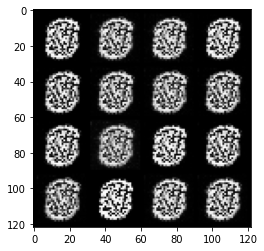

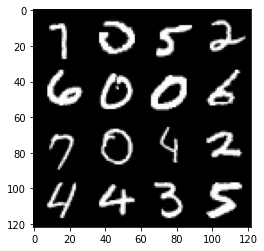

0: epoch 0 / Step Gen loss: 0.0031776144365469614 / Step Disc loss: 0.005814963452021281
EPOCH ------------- 1


  0%|          | 0/469 [00:00<?, ?it/s]

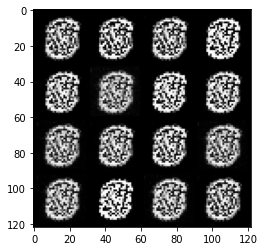

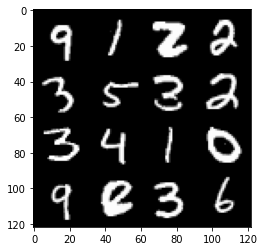

1: epoch 1 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356999319791794
EPOCH ------------- 2


  0%|          | 0/469 [00:00<?, ?it/s]

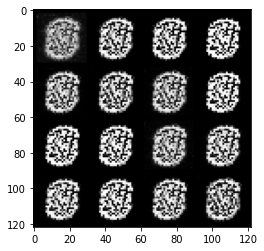

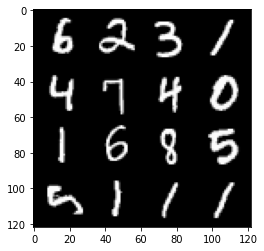

2: epoch 2 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356998570760091
EPOCH ------------- 3


  0%|          | 0/469 [00:00<?, ?it/s]

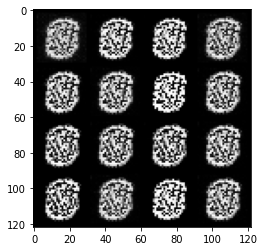

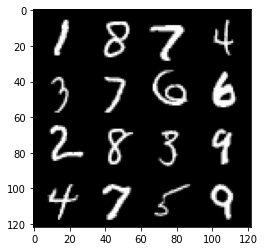

3: epoch 3 / Step Gen loss: 0.0024486626595258713 / Step Disc loss: 0.006356998014450073
EPOCH ------------- 4


  0%|          | 0/469 [00:00<?, ?it/s]

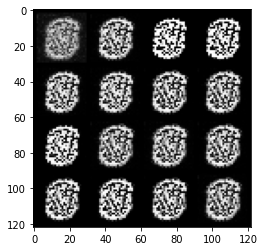

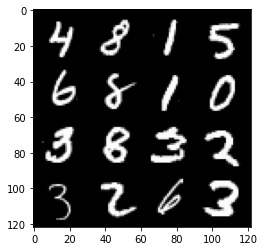

4: epoch 4 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356997579336166
EPOCH ------------- 5


  0%|          | 0/469 [00:00<?, ?it/s]

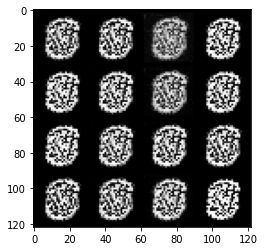

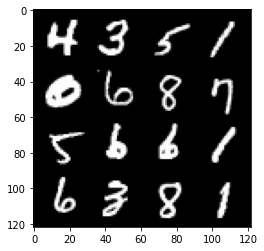

5: epoch 5 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356997234622638
EPOCH ------------- 6


  0%|          | 0/469 [00:00<?, ?it/s]

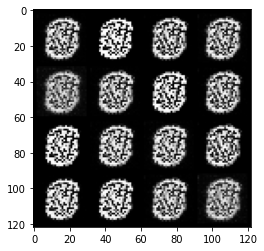

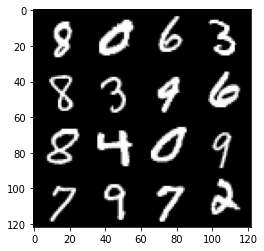

6: epoch 6 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.0063569969733556116
EPOCH ------------- 7


  0%|          | 0/469 [00:00<?, ?it/s]

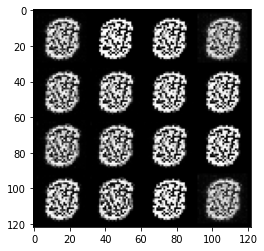

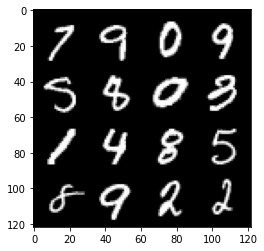

7: epoch 7 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996737917264
EPOCH ------------- 8


  0%|          | 0/469 [00:00<?, ?it/s]

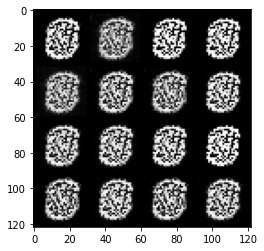

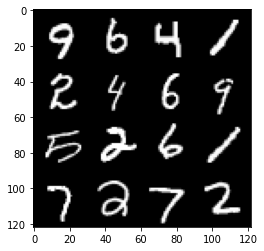

8: epoch 8 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356956213712692
EPOCH ------------- 9


  0%|          | 0/469 [00:00<?, ?it/s]

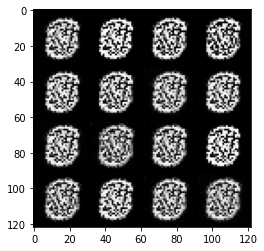

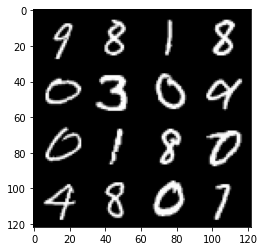

9: epoch 9 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.0063569964309533435
EPOCH ------------- 10


  0%|          | 0/469 [00:00<?, ?it/s]

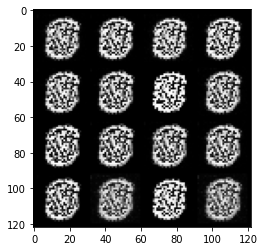

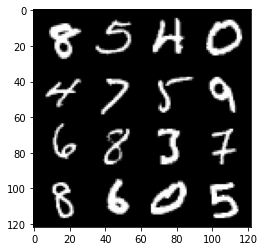

10: epoch 10 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996320684751
EPOCH ------------- 11


  0%|          | 0/469 [00:00<?, ?it/s]

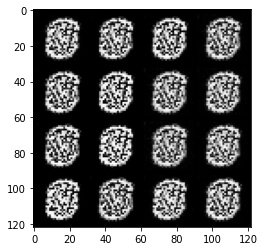

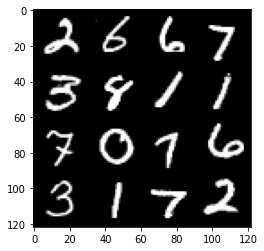

11: epoch 11 / Step Gen loss: 0.0024486626590291658 / Step Disc loss: 0.006356996247172356
EPOCH ------------- 12


  0%|          | 0/469 [00:00<?, ?it/s]

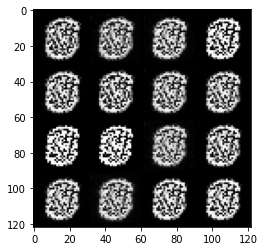

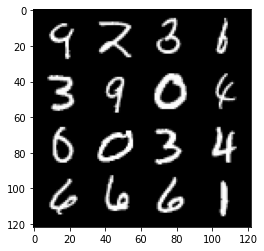

12: epoch 12 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996175646782
EPOCH ------------- 13


  0%|          | 0/469 [00:00<?, ?it/s]

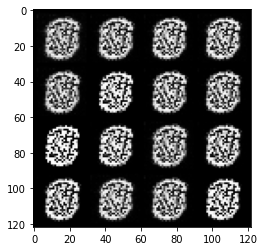

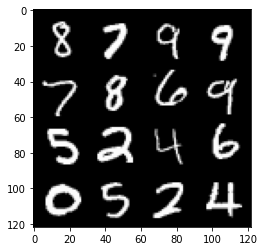

13: epoch 13 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996130943298
EPOCH ------------- 14


  0%|          | 0/469 [00:00<?, ?it/s]

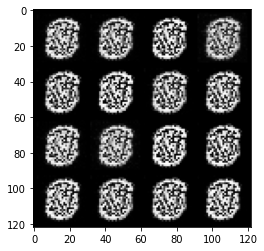

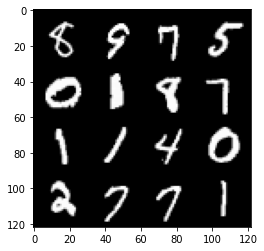

14: epoch 14 / Step Gen loss: 0.0024486626615126926 / Step Disc loss: 0.006356996091206869
EPOCH ------------- 15


  0%|          | 0/469 [00:00<?, ?it/s]

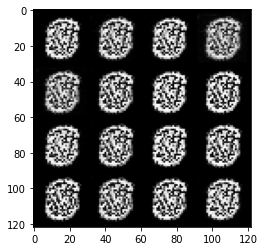

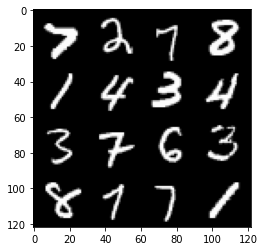

15: epoch 15 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996065378189
EPOCH ------------- 16


  0%|          | 0/469 [00:00<?, ?it/s]

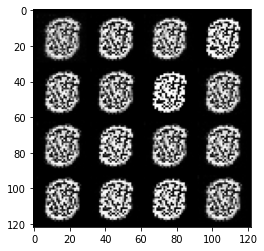

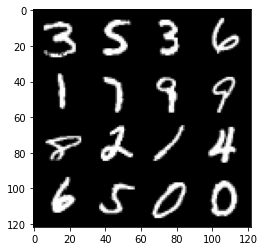

16: epoch 16 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996043523152
EPOCH ------------- 17


  0%|          | 0/469 [00:00<?, ?it/s]

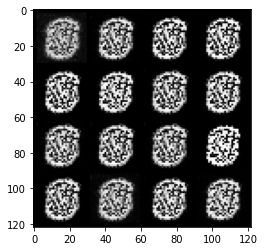

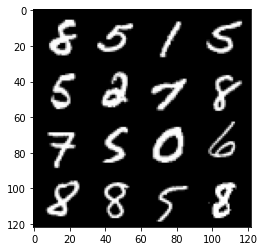

17: epoch 17 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996030608813
EPOCH ------------- 18


  0%|          | 0/469 [00:00<?, ?it/s]

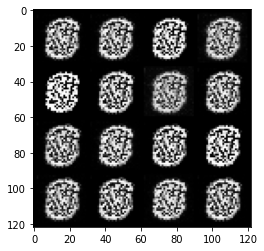

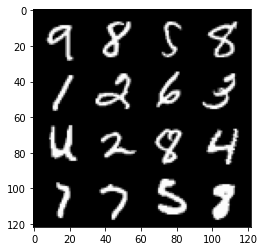

18: epoch 18 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.0063569960157076515
EPOCH ------------- 19


  0%|          | 0/469 [00:00<?, ?it/s]

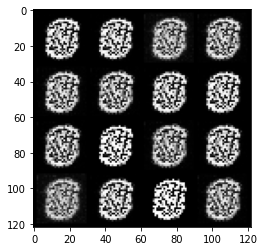

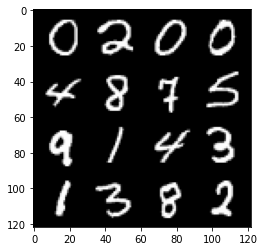

19: epoch 19 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996011734009
EPOCH ------------- 20


  0%|          | 0/469 [00:00<?, ?it/s]

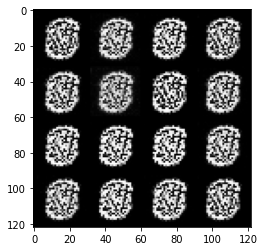

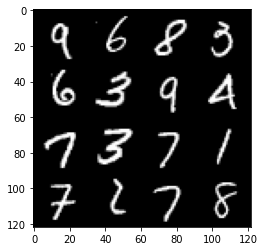

20: epoch 20 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356996003786723
EPOCH ------------- 21


  0%|          | 0/469 [00:00<?, ?it/s]

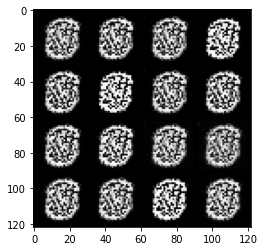

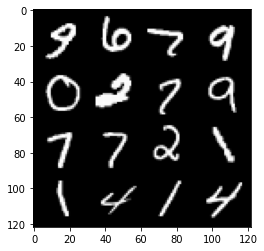

21: epoch 21 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.00635699599981308
EPOCH ------------- 22


  0%|          | 0/469 [00:00<?, ?it/s]

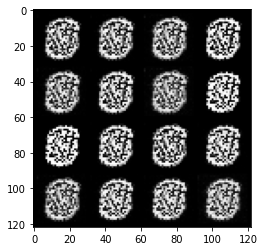

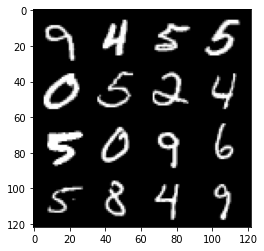

22: epoch 22 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.00635699599981308
EPOCH ------------- 23


  0%|          | 0/469 [00:00<?, ?it/s]

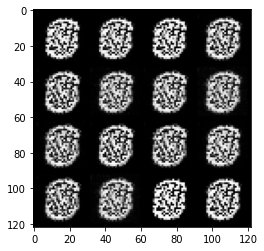

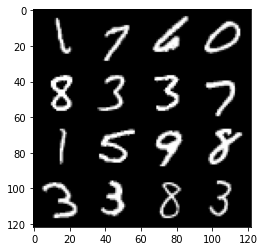

23: epoch 23 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995995839437
EPOCH ------------- 24


  0%|          | 0/469 [00:00<?, ?it/s]

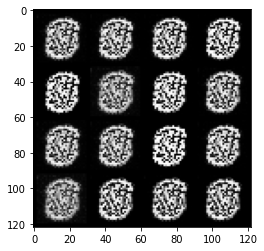

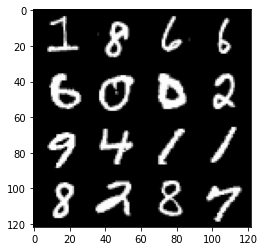

24: epoch 24 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995992859204
EPOCH ------------- 25


  0%|          | 0/469 [00:00<?, ?it/s]

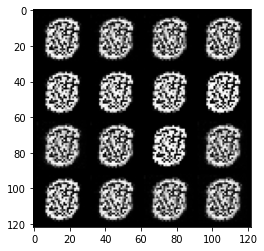

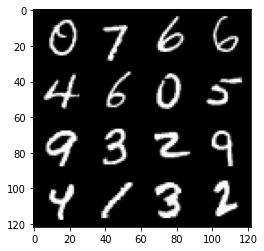

25: epoch 25 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995992859204
EPOCH ------------- 26


  0%|          | 0/469 [00:00<?, ?it/s]

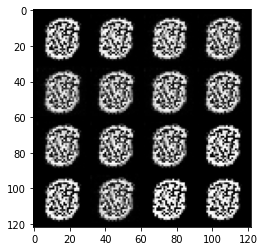

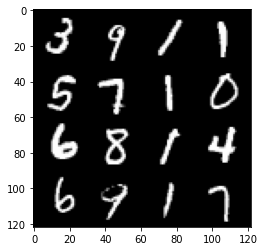

26: epoch 26 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 27


  0%|          | 0/469 [00:00<?, ?it/s]

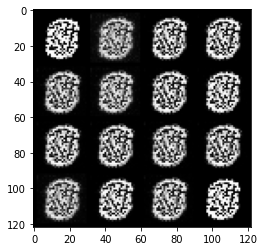

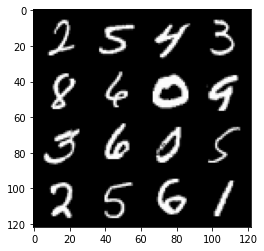

27: epoch 27 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 28


  0%|          | 0/469 [00:00<?, ?it/s]

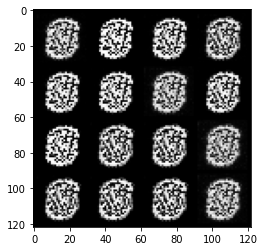

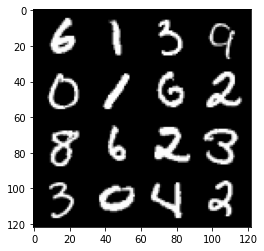

28: epoch 28 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 29


  0%|          | 0/469 [00:00<?, ?it/s]

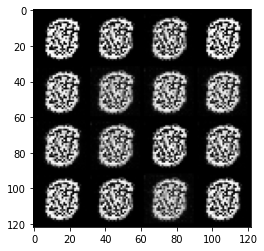

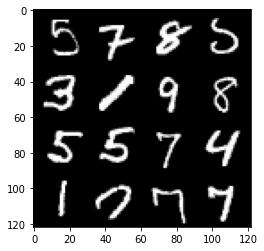

29: epoch 29 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 30


  0%|          | 0/469 [00:00<?, ?it/s]

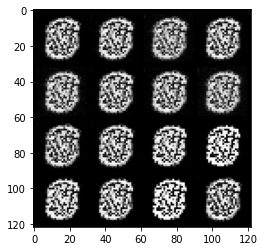

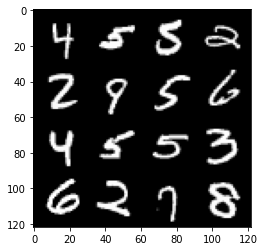

30: epoch 30 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 31


  0%|          | 0/469 [00:00<?, ?it/s]

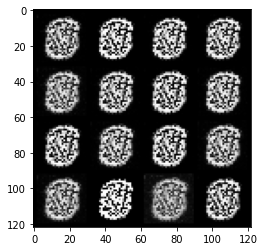

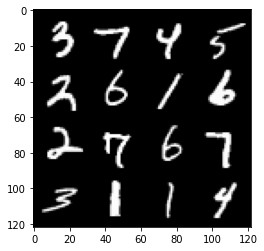

31: epoch 31 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 32


  0%|          | 0/469 [00:00<?, ?it/s]

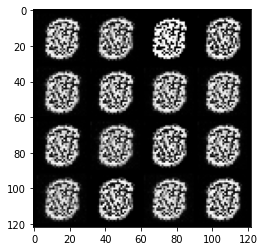

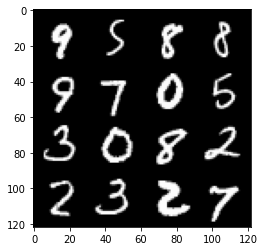

32: epoch 32 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 33


  0%|          | 0/469 [00:00<?, ?it/s]

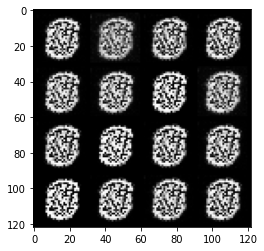

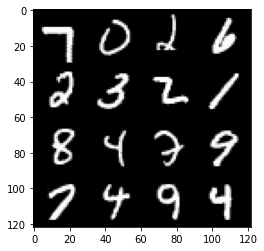

33: epoch 33 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 34


  0%|          | 0/469 [00:00<?, ?it/s]

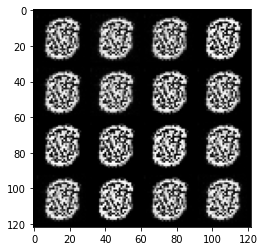

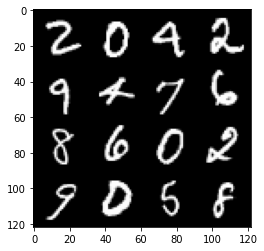

34: epoch 34 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 35


  0%|          | 0/469 [00:00<?, ?it/s]

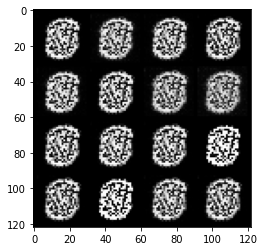

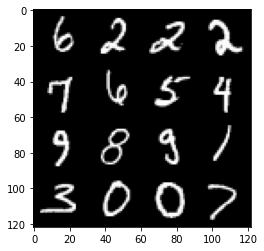

35: epoch 35 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 36


  0%|          | 0/469 [00:00<?, ?it/s]

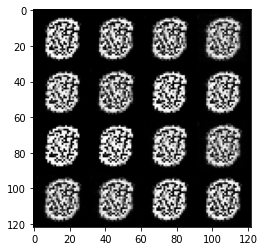

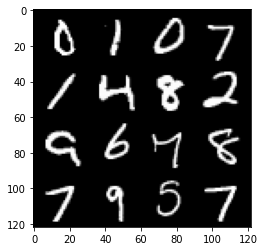

36: epoch 36 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 37


  0%|          | 0/469 [00:00<?, ?it/s]

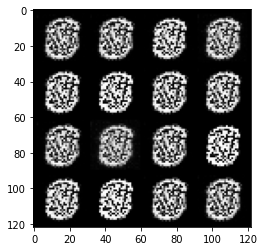

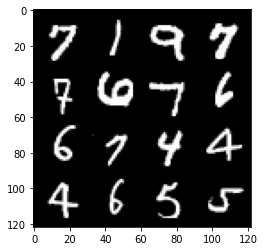

37: epoch 37 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 38


  0%|          | 0/469 [00:00<?, ?it/s]

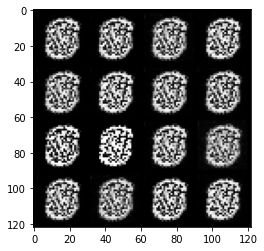

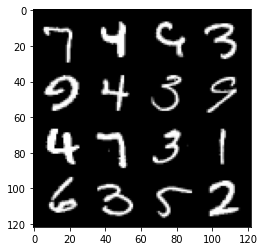

38: epoch 38 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 39


  0%|          | 0/469 [00:00<?, ?it/s]

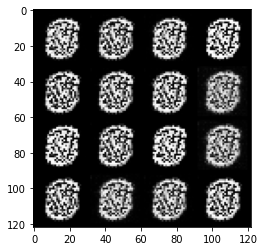

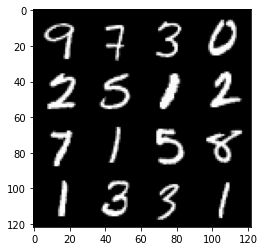

39: epoch 39 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 40


  0%|          | 0/469 [00:00<?, ?it/s]

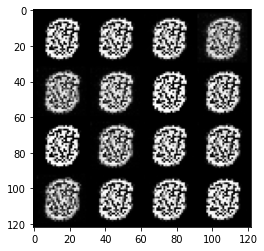

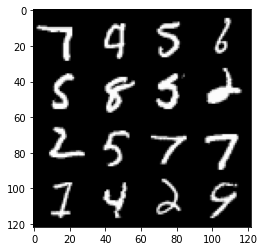

40: epoch 40 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 41


  0%|          | 0/469 [00:00<?, ?it/s]

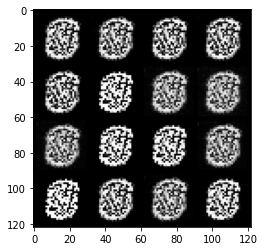

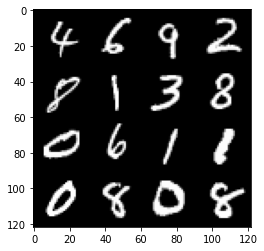

41: epoch 41 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 42


  0%|          | 0/469 [00:00<?, ?it/s]

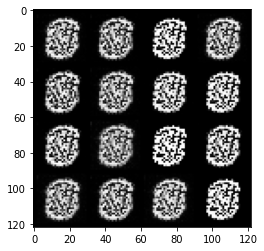

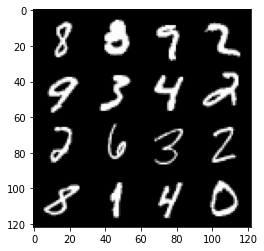

42: epoch 42 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 43


  0%|          | 0/469 [00:00<?, ?it/s]

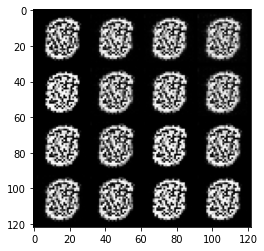

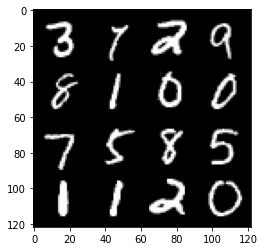

43: epoch 43 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 44


  0%|          | 0/469 [00:00<?, ?it/s]

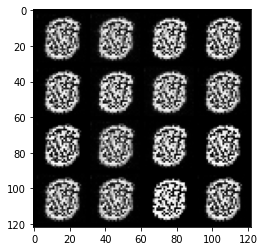

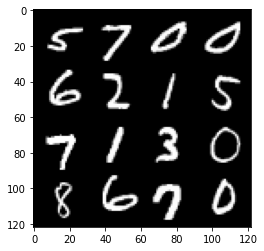

44: epoch 44 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 45


  0%|          | 0/469 [00:00<?, ?it/s]

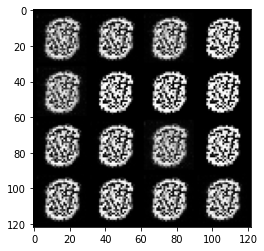

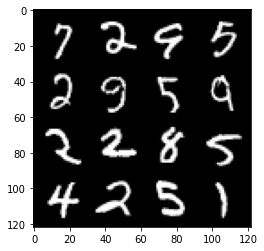

45: epoch 45 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 46


  0%|          | 0/469 [00:00<?, ?it/s]

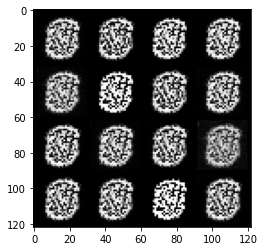

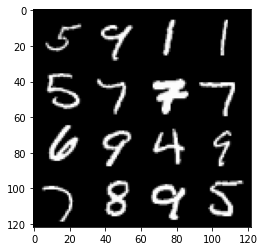

46: epoch 46 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 47


  0%|          | 0/469 [00:00<?, ?it/s]

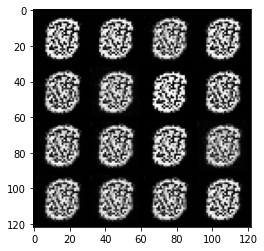

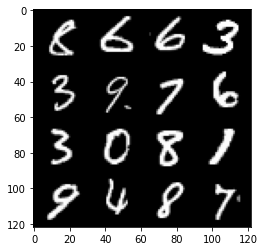

47: epoch 47 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 48


  0%|          | 0/469 [00:00<?, ?it/s]

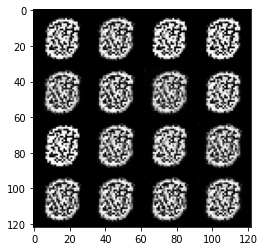

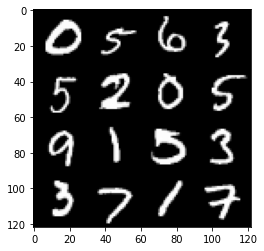

48: epoch 48 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 49


  0%|          | 0/469 [00:00<?, ?it/s]

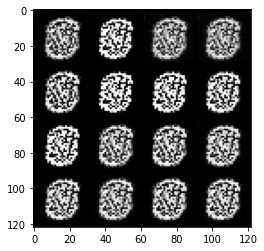

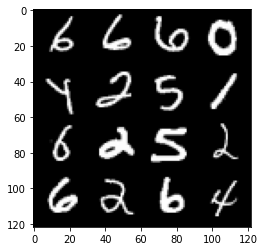

49: epoch 49 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 50


  0%|          | 0/469 [00:00<?, ?it/s]

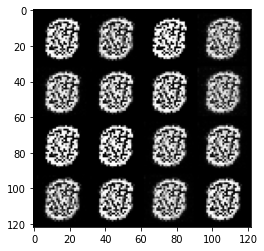

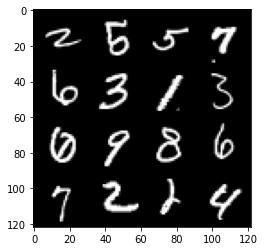

50: epoch 50 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 51


  0%|          | 0/469 [00:00<?, ?it/s]

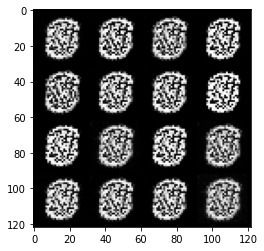

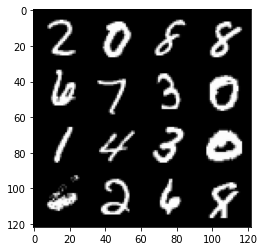

51: epoch 51 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 52


  0%|          | 0/469 [00:00<?, ?it/s]

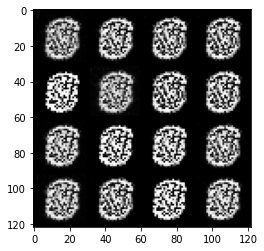

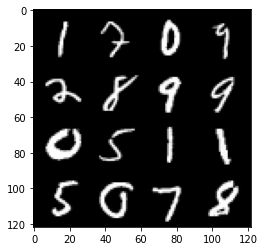

52: epoch 52 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 53


  0%|          | 0/469 [00:00<?, ?it/s]

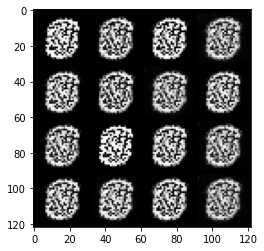

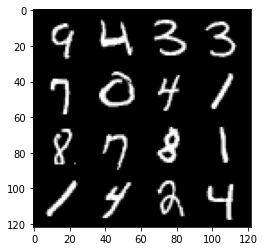

53: epoch 53 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 54


  0%|          | 0/469 [00:00<?, ?it/s]

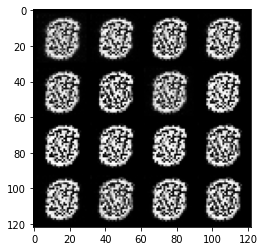

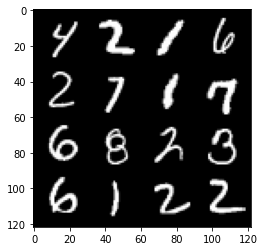

54: epoch 54 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 55


  0%|          | 0/469 [00:00<?, ?it/s]

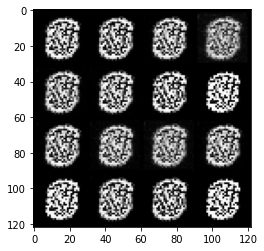

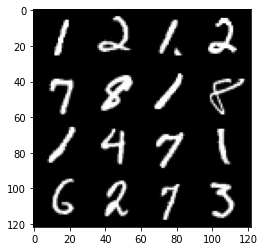

55: epoch 55 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 56


  0%|          | 0/469 [00:00<?, ?it/s]

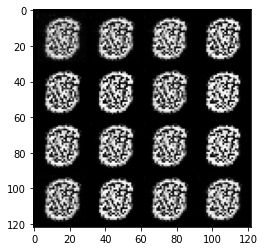

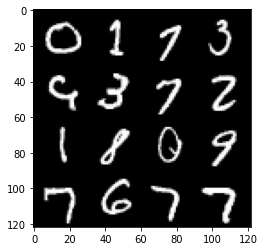

56: epoch 56 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 57


  0%|          | 0/469 [00:00<?, ?it/s]

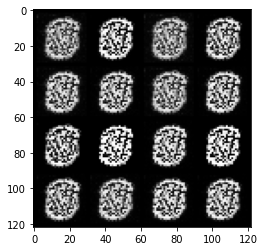

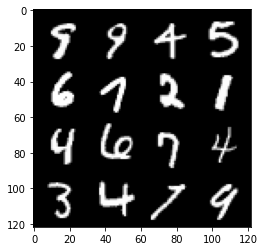

57: epoch 57 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 58


  0%|          | 0/469 [00:00<?, ?it/s]

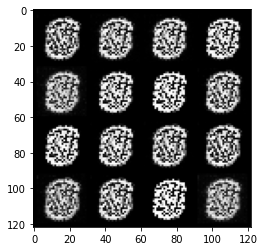

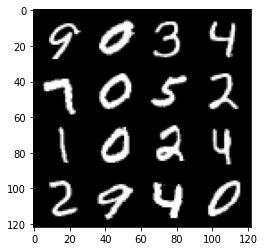

58: epoch 58 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 59


  0%|          | 0/469 [00:00<?, ?it/s]

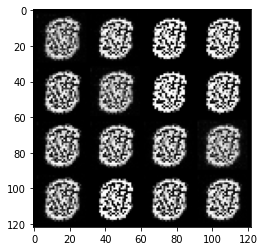

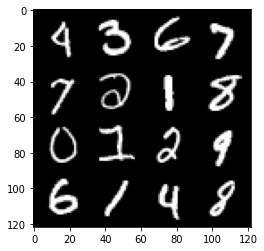

59: epoch 59 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 60


  0%|          | 0/469 [00:00<?, ?it/s]

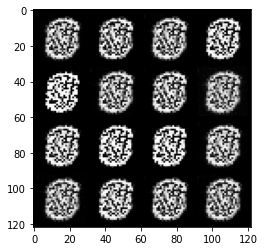

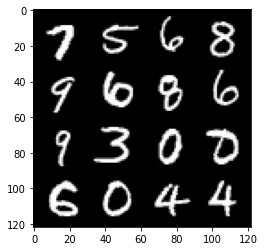

60: epoch 60 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 61


  0%|          | 0/469 [00:00<?, ?it/s]

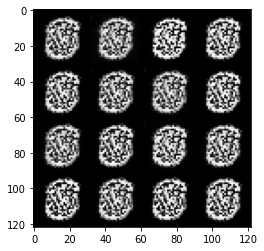

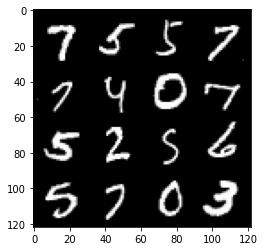

61: epoch 61 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 62


  0%|          | 0/469 [00:00<?, ?it/s]

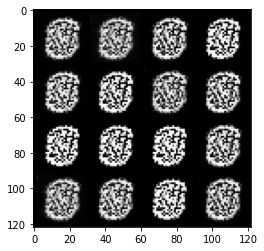

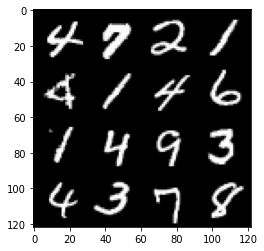

62: epoch 62 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 63


  0%|          | 0/469 [00:00<?, ?it/s]

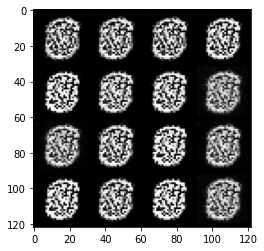

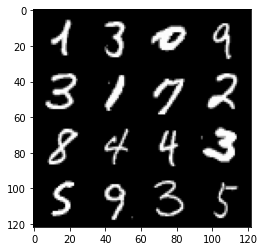

63: epoch 63 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 64


  0%|          | 0/469 [00:00<?, ?it/s]

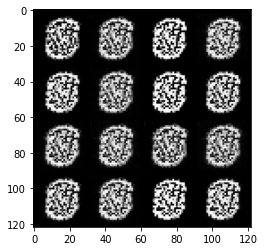

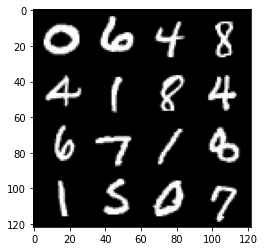

64: epoch 64 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 65


  0%|          | 0/469 [00:00<?, ?it/s]

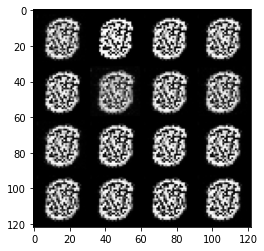

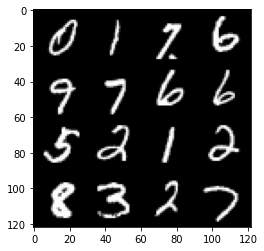

65: epoch 65 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 66


  0%|          | 0/469 [00:00<?, ?it/s]

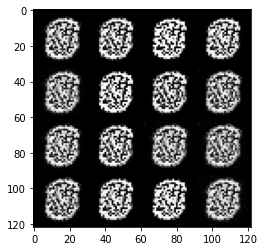

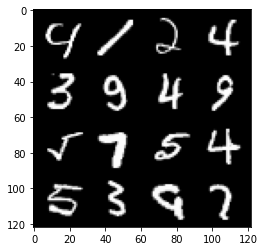

66: epoch 66 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 67


  0%|          | 0/469 [00:00<?, ?it/s]

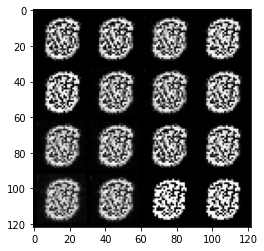

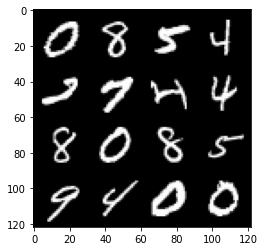

67: epoch 67 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 68


  0%|          | 0/469 [00:00<?, ?it/s]

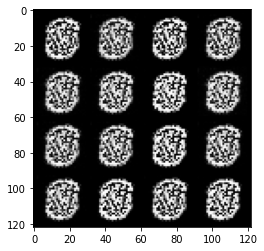

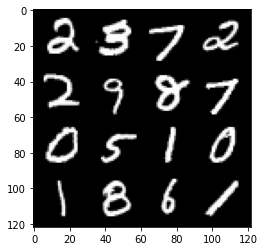

68: epoch 68 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 69


  0%|          | 0/469 [00:00<?, ?it/s]

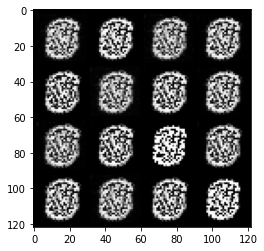

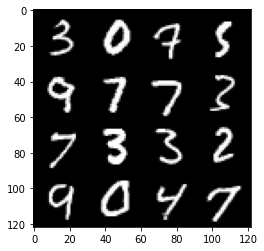

69: epoch 69 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 70


  0%|          | 0/469 [00:00<?, ?it/s]

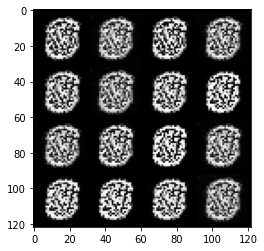

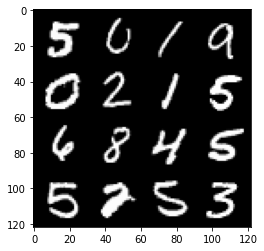

70: epoch 70 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 71


  0%|          | 0/469 [00:00<?, ?it/s]

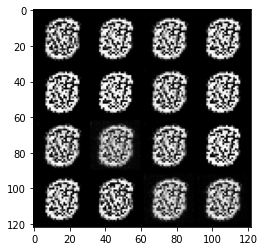

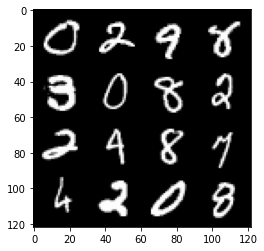

71: epoch 71 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 72


  0%|          | 0/469 [00:00<?, ?it/s]

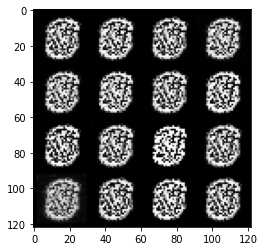

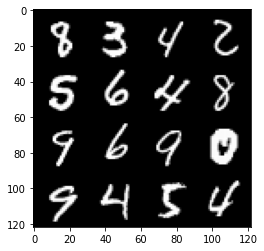

72: epoch 72 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 73


  0%|          | 0/469 [00:00<?, ?it/s]

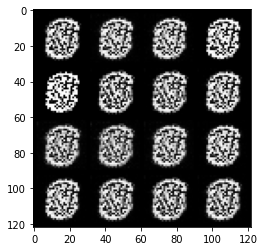

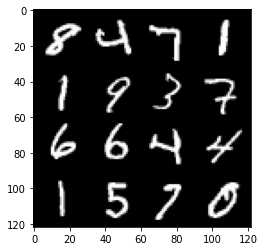

73: epoch 73 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 74


  0%|          | 0/469 [00:00<?, ?it/s]

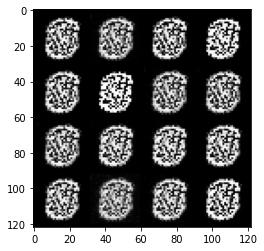

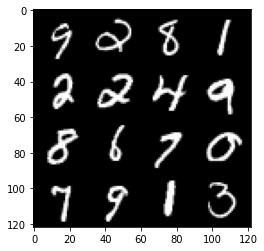

74: epoch 74 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 75


  0%|          | 0/469 [00:00<?, ?it/s]

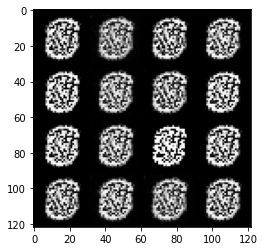

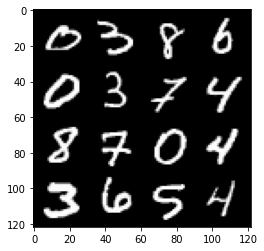

75: epoch 75 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 76


  0%|          | 0/469 [00:00<?, ?it/s]

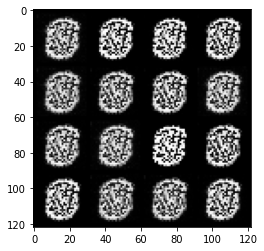

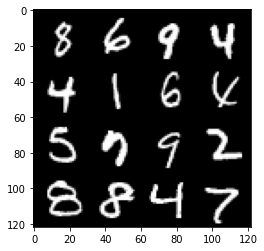

76: epoch 76 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 77


  0%|          | 0/469 [00:00<?, ?it/s]

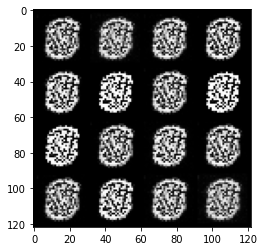

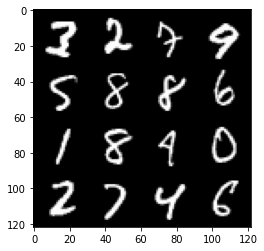

77: epoch 77 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 78


  0%|          | 0/469 [00:00<?, ?it/s]

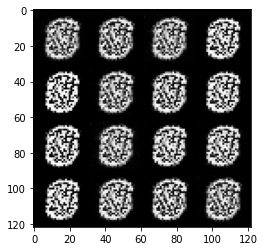

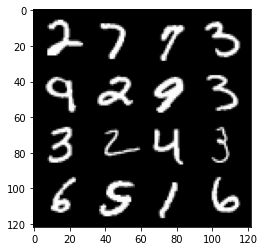

78: epoch 78 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 79


  0%|          | 0/469 [00:00<?, ?it/s]

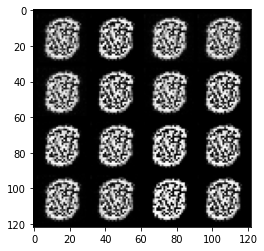

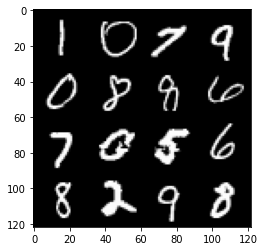

79: epoch 79 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 80


  0%|          | 0/469 [00:00<?, ?it/s]

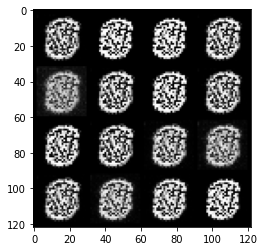

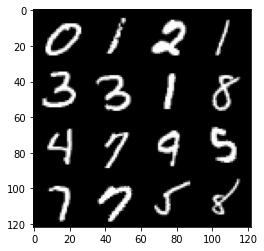

80: epoch 80 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 81


  0%|          | 0/469 [00:00<?, ?it/s]

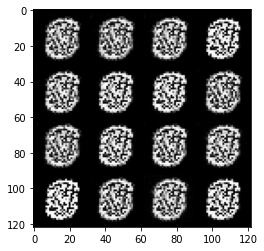

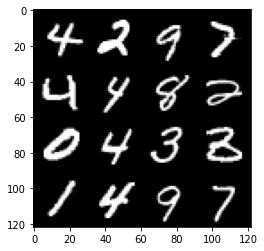

81: epoch 81 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 82


  0%|          | 0/469 [00:00<?, ?it/s]

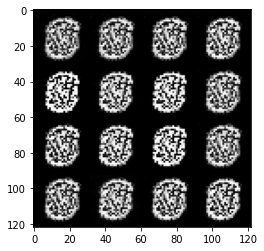

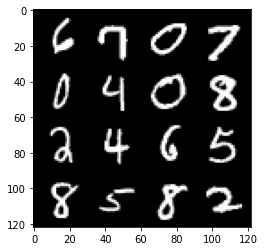

82: epoch 82 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 83


  0%|          | 0/469 [00:00<?, ?it/s]

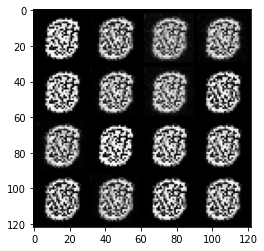

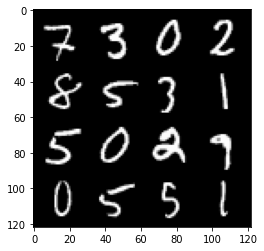

83: epoch 83 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 84


  0%|          | 0/469 [00:00<?, ?it/s]

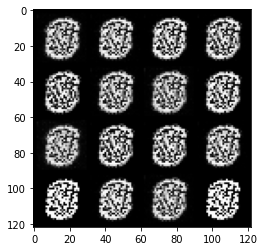

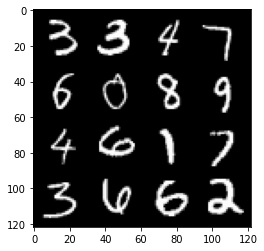

84: epoch 84 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 85


  0%|          | 0/469 [00:00<?, ?it/s]

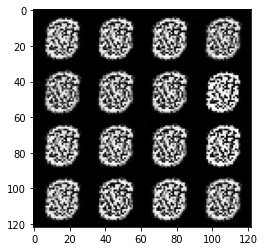

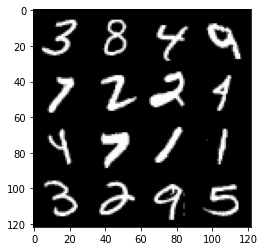

85: epoch 85 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 86


  0%|          | 0/469 [00:00<?, ?it/s]

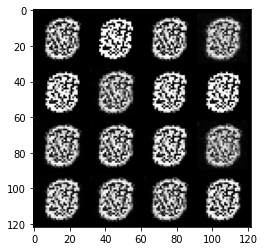

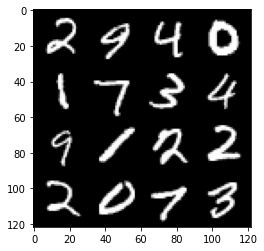

86: epoch 86 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 87


  0%|          | 0/469 [00:00<?, ?it/s]

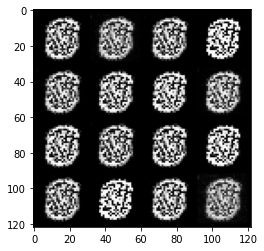

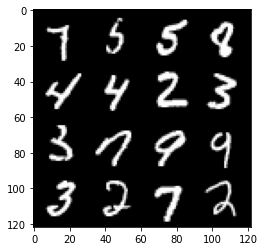

87: epoch 87 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 88


  0%|          | 0/469 [00:00<?, ?it/s]

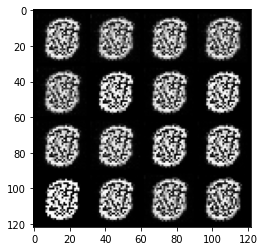

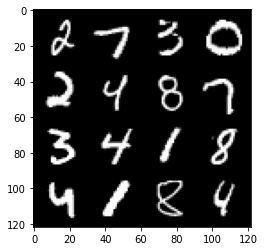

88: epoch 88 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 89


  0%|          | 0/469 [00:00<?, ?it/s]

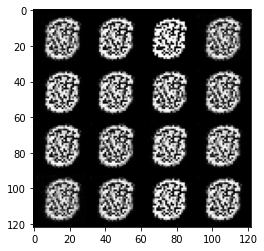

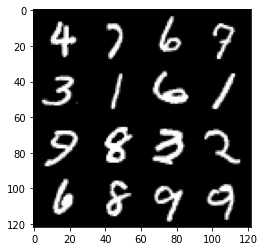

89: epoch 89 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 90


  0%|          | 0/469 [00:00<?, ?it/s]

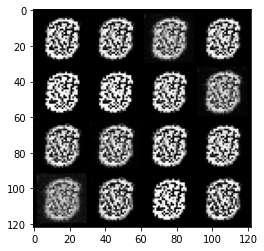

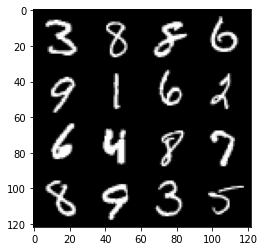

90: epoch 90 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 91


  0%|          | 0/469 [00:00<?, ?it/s]

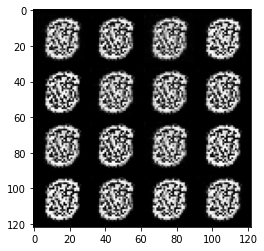

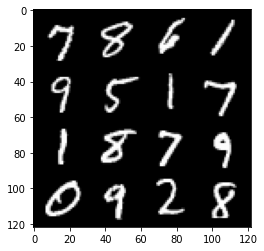

91: epoch 91 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 92


  0%|          | 0/469 [00:00<?, ?it/s]

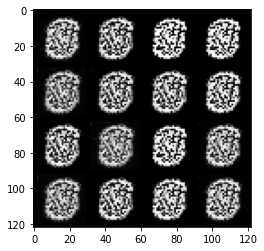

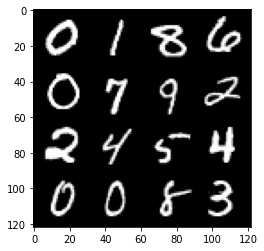

92: epoch 92 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 93


  0%|          | 0/469 [00:00<?, ?it/s]

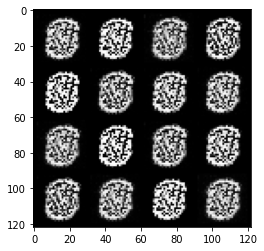

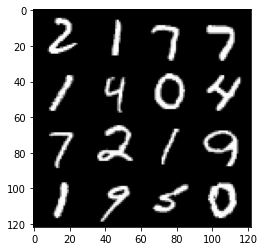

93: epoch 93 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 94


  0%|          | 0/469 [00:00<?, ?it/s]

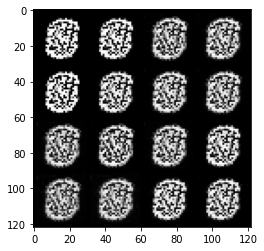

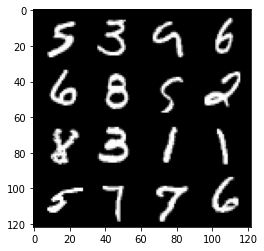

94: epoch 94 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 95


  0%|          | 0/469 [00:00<?, ?it/s]

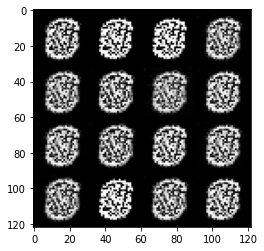

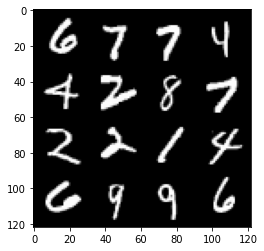

95: epoch 95 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 96


  0%|          | 0/469 [00:00<?, ?it/s]

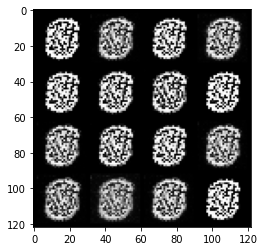

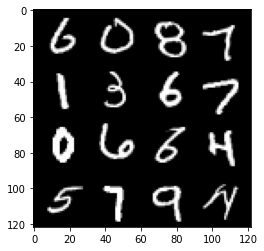

96: epoch 96 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 97


  0%|          | 0/469 [00:00<?, ?it/s]

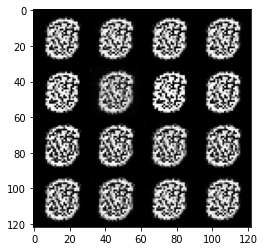

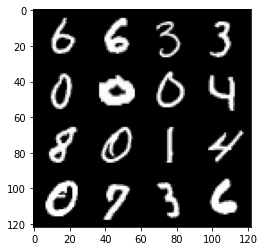

97: epoch 97 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 98


  0%|          | 0/469 [00:00<?, ?it/s]

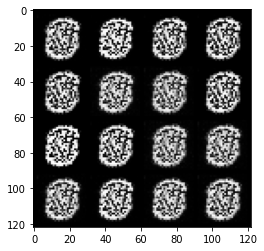

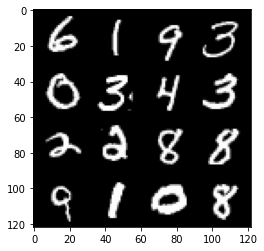

98: epoch 98 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794
EPOCH ------------- 99


  0%|          | 0/469 [00:00<?, ?it/s]

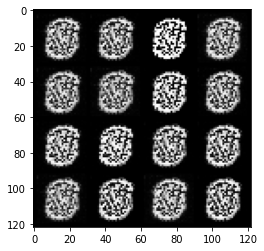

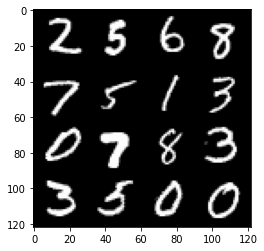

99: epoch 99 / Step Gen loss: 0.0024486626585324607 / Step Disc loss: 0.006356995991865794


In [ ]:
for epoch in range(epochs):
  print(f'EPOCH ------------- {epoch}')
  total_steps = 0
  for real,_ in tqdm(dataloader):

    ### discriminator
    disc_opt.zero_grad()
    cur_bs = len(real) # 128 X 1 X 28 X 28

    real = real.view(cur_bs, -1)
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_fn, gen, disc, cur_bs, real, z_dim)
    disc_loss.backward(retain_graph =True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_fn,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()
    mean_gen_loss+=gen_loss.item()

    total_steps += cur_bs

  mean_disc_loss = mean_disc_loss/total_steps
  mean_gen_loss = mean_gen_loss/total_steps
  fake_noise = generate_noise(cur_bs, z_dim)
  fake = gen(fake_noise)
  show(fake)
  show(real)
  print(f"{epoch}: epoch {epoch} / Step Gen loss: {mean_gen_loss} / Step Disc loss: {mean_disc_loss}")
  mean_gen_loss, mean_disc_loss=0,0
